# Mock Observations with MUSTANG-2

We use Maria to generate synthetic mock observations for bolometric arrays installed on single-dish telescopes. We have developed a wrapper called 'Simulation,' which emulates telescopes like ACT, Toltec, GBT, and AtLAST. This wrapper generates time-ordered domain (TOD) data. By simulating distinct atmospheric layers corresponding to the designated site within the simulation, we allow the mock array to sweep across the input celestial sky while scanning through evolving atmosphere. As a result, the TODs produced combine elements of the real sky, atmospheric effects. This approach generates synthetic observations taking into account atmospheric filtering. 

This tutorial will guide you through the process of setting up the simulation tool and creating your own mock observations.

In [1]:
import matplotlib.pyplot as plt
import scipy as sp
import numpy as np
import cmocean

from astropy.io import fits
from astropy.wcs import WCS
from astropy import units as u
from astropy.constants import c
from astropy.coordinates import SkyCoord
import os

In [2]:
import matplotlib
plt.style.use('/Users/jvanmarr/Documents/Papers/Plot_style/thesis.mplstyle')
matplotlib.rc('image', origin='lower')
cmap = "RdBu_r"

In [3]:
from maria import Simulation
from maria.map.mappers import BinMapper
from maria import TOD, utils

import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning) 

In [4]:
months = np.array(['JAN', 'FEB', 'MAR', 'APR', 'MAY', 'JUN', 'JUL', 'AUG', 'SEP', 'OCT', 'NOV', 'DEC'])

def time_converter(time):
    month  = np.where(months == time.split('-')[1])[0]+1
    year  = (time.split('-')[2])[:4]
    day   = time.split('-')[0]
    time  = time.split('.')[0][-8:]
    return "{}-{:02d}-{:02d}T{}".format(year,int(month),int(day),time)

In [5]:
def get_signal_files(directory_path):
    # Get the list of files in the directory
    file_list = os.listdir(directory_path)

    # Filter files that start with "Signal"
    signal_files = [filename for filename in file_list if filename.startswith('Signal')]

    return signal_files

In [6]:
def circle_mask(im, xc, yc, rcirc):
        ny, nx = im.shape
        y,x = np.mgrid[0:nx,0:ny]
        r = np.sqrt((x-xc)*(x-xc) + (y-yc)*(y-yc))
        return ( (r < rcirc))

def r_theta(im, xc, yc):
    # returns the radius rr and the angle phi for point (xc,yc)
    ny, nx = im.shape
    yp, xp = np.mgrid[0:ny,0:nx]
    yp = yp - yc
    xp = xp - xc
    rr = np.sqrt(np.power(yp,2.) + np.power(xp,2.))
    phi = np.arctan2(yp, xp)
    return(rr, phi)    

## Setting up a MUSTANG-2 Simulation
The ```Simulation``` class offers flexibility for customizing atmospheric simulations. You can configure it to replicate observatories like 'AtLAST' at the APEX site or simulate specific observations, such as MUSTANG-2, under different weather conditions by adjusting the 'pwv_rms_frac' parameter within the Simulation keywords.

Additionally, the ```Simulation``` class allows you to explore how different scanning strategies impact large-scale filtering. Standard strategies, like back-and-forth or Daisy scan patterns, are implemented for this purpose. For comprehensive documentation on all available keywords, please refer to our detailed documentation. 

Now, let's initiate an example of a mock observation involving a galaxy cluster merger event at redshift 1, observed via the SZ effect, using the Mustang-2 instrument:

In [7]:
from maria.utils.io import fetch_cache

TEST_MAP_URL = (
    "https://github.com/thomaswmorris/maria-data/raw/master/maps/cluster.fits"
)

fetch_cache(TEST_MAP_URL, "/tmp/cluster.fits", refresh=True)

updating cache from https://github.com/thomaswmorris/maria-data/raw/master/maps/cluster.fits
downloaded data (4.0 MB) to /tmp/cluster.fits


In [8]:
pixel_size = 8.71452898559111e-05
sample_rate = 50
scan_velocity = 53/3600

inputfile = "/tmp/cluster.fits"
# outfile_map = "/tmp/fake_cluster_noisy.fits"
outfile_map = "/tmp/fake_cluster_noiseless.fits"
# outfile_map = "/tmp/empty.fits"

atm_model = "2d"

In [9]:
dir = "/Users/jvanmarr/Documents/Papers/maria/sims/data/M2-data/New/TS_EaCMS0f0_51_19_Dec_2023/"
fls = get_signal_files(dir)
# for f in fls: print(f)

In [10]:
# # i_file = 3
# for i_file in range(len(fls)):
#     filename = fls[i_file]
#     mustang2_tod_file = dir + filename

#     hdu_table = fits.open(mustang2_tod_file)

#     obs_time = time_converter(hdu_table[1].header['OBSSTART'])
#     print(obs_time)

In [11]:
start_time = "2019-01-12T12:00:58"

### Hyper params

In [64]:
pointing_center = (np.degrees(hdu_table[1].data['DX'].mean()), np.degrees(hdu_table[1].data['DY'].mean()))
pointing_center

(175.66866, 15.451079)

In [12]:
i_file = 3
# for i_file in range(20):
filename = fls[i_file]

mustang2_tod_file = dir + filename
tod_real = TOD.from_fits(fname=mustang2_tod_file, format='mustang-2')
hdu_table = fits.open(mustang2_tod_file)

pointing_center = (np.degrees(hdu_table[1].data['DX'].mean()), np.degrees(hdu_table[1].data['DY'].mean()))
obs_time = time_converter(hdu_table[1].header['OBSSTART'])

# integration_time = ((hdu_table[1].data['TIME'][-1]).astype(int)).astype(float)
integration_time = 45 * 60

# - Input figure
hdu = fits.open(inputfile)
hdu[0].data = hdu[0].data
header = hdu[0].header

header["CDELT1"] = pixel_size  # degree
header["CDELT2"] = pixel_size  # degree
header["CTYPE1"] = "RA---SIN"
header["CUNIT1"] = "deg     "
header["CTYPE2"] = "DEC--SIN"
header["CUNIT2"] = "deg     "
header["CRVAL1"] = pointing_center[0]
header["CRVAL2"] = pointing_center[1]

wcs_input = WCS(header, naxis=2)

In [13]:

# - Input figure
hdu = fits.open(inputfile)
hdu[0].data = hdu[0].data
header = hdu[0].header

header["CDELT1"] = pixel_size  # degree
header["CDELT2"] = pixel_size  # degree
header["CTYPE1"] = "RA---SIN"
header["CUNIT1"] = "deg     "
header["CTYPE2"] = "DEC--SIN"
header["CUNIT2"] = "deg     "
header["CRVAL1"] = pointing_center[0]
header["CRVAL2"] = pointing_center[1]

wcs_input = WCS(header, naxis=2)

In [62]:
 hdu_table[1].header['OBSSTART'], time_converter(hdu_table[1].header['OBSSTART'])

(' 9-DEC-2023 11:01:15.00', '2023-12-09T11:01:15')

### Initialize
First we need to initialize the telescope and weather conditions

In [15]:
nscans = 1

if nscans == 1:
    obs_times = [
        time_converter(hdu_table[1].header['OBSSTART'])
    ]
else:
    obs_times = [
        '2023-12-09T09:00:00',
        '2023-12-09T09:45:00',
        '2023-12-09T10:30:00',
        '2023-12-09T11:15:00',
        '2023-12-09T12:00:00',
    ]

In [16]:
tods = []
for i in range (nscans):
    sim = Simulation(
        # Mandatory minimal weither settings
        # ---------------------
        instrument="MUSTANG-2",  # Array type
        pointing="daisy",  # Scanning strategy
        site="green_bank",  # Site    
        
        atmosphere_model=None, #atmospheric model
        
        # True sky input
        # ---------------------
        map_file=inputfile,          # Input files must be a fits file.
        map_units="Jy/pixel",        # Units of the input map in Kelvin Rayleigh Jeans (K, defeault) or Jy/pixel
        
        map_res=pixel_size,          # resolution of the map
        map_center=pointing_center,  # RA & Dec in degree
        map_freqs = [93],
    
        # MUSTANG-2 Observational setup
        # ----------------------------s
        scan_options = {
            "radius":  4.0 / 60.0,  # The radius of the Daisy scan in degrees
            "speed":  scan_velocity # scan velocity in when the scan goes through the center deg/s
        },
    
        bands = {
        'f093':{
          'n_dets': 217,
          'band_center': 92,
          'band_width': 30,
          # 'white_noise': 1.7e-3 * 0.3 / 1.25, # in K_RJ s^-1/2
          # 'pink_noise': 1.     * 0.3 / 1.25   # in K_RJ s^-1/2}
          'white_noise': 0.,
          'pink_noise': 0.
            }
        },
        
        integration_time=integration_time,  # Seconds
        sample_rate=sample_rate,  # Hz
        scan_center=pointing_center,  # Degrees
        pointing_frame="ra_dec",  # Frame
        start_time = obs_times[i],
        
        pwv_rms_frac=0.005, #level of atmospheric fluctuations
        verbose=True
    )
    
    tod = sim.run()
    tods.append(tod)

created cache at /tmp/maria_data_cache/weather/era5
updating cache from https://github.com/thomaswmorris/maria-data/raw/master/weather/era5/green_bank.h5
downloaded data (2.1 MB) to /tmp/maria_data_cache/weather/era5/green_bank.h5


Sampling input map: 100%|█████████████████████████| 1/1 [00:10<00:00, 10.04s/it]


In [17]:
# tod.to_fits(fname='/tmp/test_save_mustang2.fits', format='mustang-2')

### Obtaining time-ordered data (TODs)
To acquire time-ordered data (TODs), you only need to run the script. The TOD object contains time stamps, coordinates (in RA and Dec), and the intensity of each scan for every detector. The intensity units are consistently expressed in surface brightness temperature units: Kelvin Rayleigh-Jeans (Even if the input map is given in Jy/pixel. We convert the units under the hood).

The above class generates a synthethic TOD. However, if you would rather use a real tod, such as for instance those from MUSTANG-2 observations. You can also run the following set of commands (for now commented out):

### Usefull visualizations:
Before proceeding, we first need to adjust the input sky as specified in the Simulation class above.

Now, let's visualize the scanning strategy and the TOD. The top two panels display the scanning trajectory in the elevation and azimuthal plane, while on the right, we present it on the celestial plane. This allows you to check if the scanning pattern aligns with the astronomical source.

The two bottom panels show the mean powerspectra and time series of the observations.

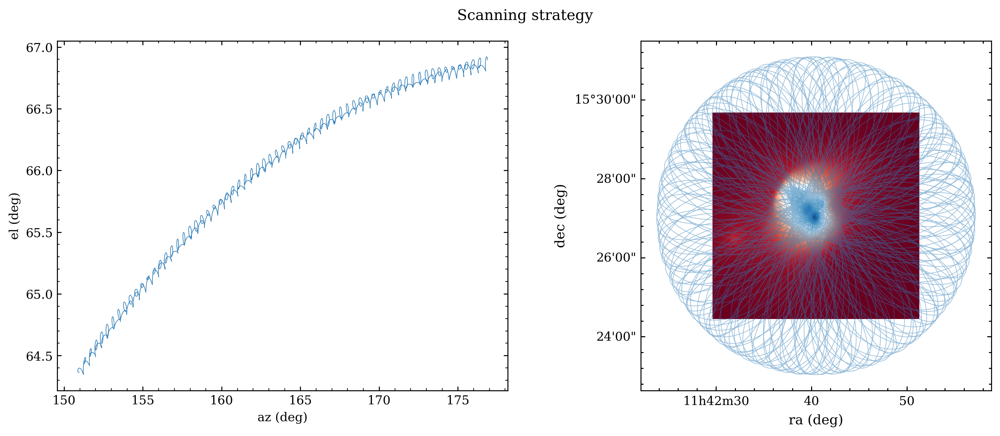

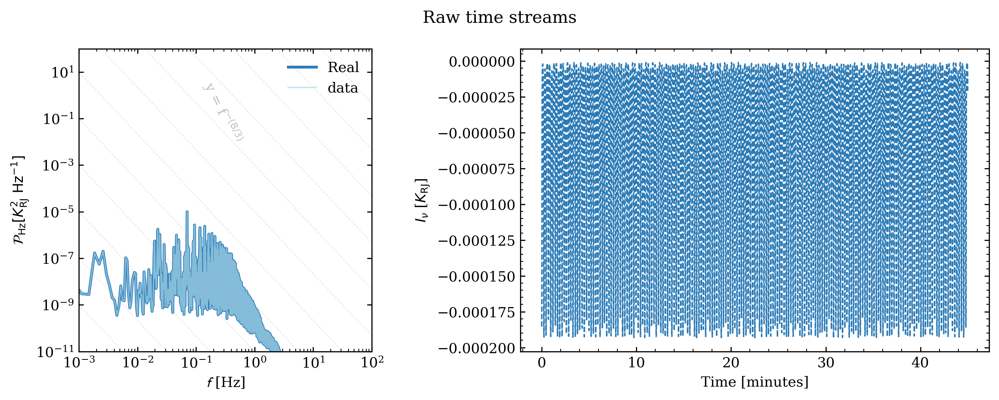

In [18]:
# visualize scanning patern
# -----------------------
cmap = "RdBu_r"

fig = plt.figure(dpi=256, tight_layout=True)
fig.set_size_inches(12, 5, forward=True)
fig.suptitle("Scanning strategy")

# - Plot
ax = plt.subplot(1, 2, 1)

ax.plot(np.degrees(tod.boresight.az), np.degrees(tod.boresight.el), lw=5e-1)
ax.set_xlabel("az (deg)"), ax.set_ylabel("el (deg)")

ax = plt.subplot(1, 2, 2, projection=wcs_input)
im = ax.imshow(hdu[0].data, cmap=cmap)

ra, dec = ax.coords
ra.set_major_formatter("hh:mm:ss")
dec.set_major_formatter("dd:mm:ss")
ra.set_axislabel(r"RA [J2000]", size=11)
dec.set_axislabel(r"Dec [J2000]", size=11)
ra.set_separator(("h", "m"))

sky = SkyCoord(np.degrees(tod.boresight.ra) * u.deg, np.degrees(tod.boresight.dec) * u.deg)
pixel_sky = wcs_input.world_to_pixel(sky)
ax.plot(pixel_sky[0], pixel_sky[1], lw=5e-1, alpha=0.5)
ax.set_xlabel("ra (deg)"), ax.set_ylabel("dec (deg)")
plt.show()

# visualize powerspectrum
# -----------------------
f, ps = sp.signal.periodogram(tod.data, fs=1/(tod.time[1] - tod.time[0]), window="tukey")

fig, axes = plt.subplots(1, 2, figsize=(10, 4), dpi=256, tight_layout=True, gridspec_kw={'width_ratios': [1, 1.6]})
fig.suptitle('Raw time streams')

for i in range(-20,20,2): axes[0].plot(np.logspace(-7, 3,100), np.logspace(-7, 3,100) ** (-8 / 3)/1e11/(10**i), c = 'gray', alpha = 0.2, ls = '--', lw = 0.5)
axes[0].text(1.2e-1,1e-2, r"y = f$^{-(8/3)}$", c = 'gray', alpha = 0.5, rotation = -64)

axes[0].plot(f[1:], ps.mean(axis=0)[1:], label="Real", alpha = 1., c = 'C0', lw = 2, ls = '-')
for key in tod._data.keys():
    f_, ps_ = sp.signal.periodogram(tod._data[key], fs=1/(tod.time[1] - tod.time[0]), window="tukey")
    if key == 'map':
        axes[0].plot(f_[1:], ps_.mean(axis=0)[1:], alpha = .7, label= 'data', c = 'C1', lw = 1, ls = '-')
    else:
        axes[0].plot(f_[1:], ps_.mean(axis=0)[1:], alpha = .4, c = 'k', lw = 1, ls = '-')

    
axes[0].set_xlabel(r"$\mathcal{f}$ [Hz]"), 
axes[0].set_ylabel(r"$\mathcal{P}_{\rm Hz}[K_{\rm RJ}^2~{\rm Hz}^{-1}]$")
axes[0].loglog()
axes[0].legend(loc = 1, frameon=False)
axes[0].axis(xmin=1e-3, xmax = 1e2, ymin = 1e-11, ymax = 1e2)



axes[1].set_xlabel('Time [minutes]'), axes[1].set_ylabel("\n"+r'$I_\nu$ [$K_{\rm RJ}$]')
axes[1].plot((tod.time - tod.time[0])/60, tod.data.mean(axis=0), label = 'Real', alpha = 1., c = 'C0', lw = 1, ls = '--')
plt.show()

## Mapping the TODs
To transform the TODs into images, you'll require a mapper. While you have the option to create your custom mapper using the saved TODs, we have also included a pre-implemented choice for your convenience. This built-in mapper follows a straightforward approach: it first fourier fitlers the time-streams to remove any noise smaller than the resolution of the dish and larger than the FOV. You can turn this filtering of by setting ```map_filter=False```. Then, we also remove the common mode in the timestream. We do this by removing the first eigenmode (set by ```n_modes_to_remove=1```). Then, the mapper structures the TOD on the specified grid. Notably, the mapper is designed to effectively eliminate correlated atmospheric noise among different scans, thereby enhancing the quality of the resulting images.

An example of how to run the mapper on the TOD is as follows:

In [19]:
mapper = BinMapper(
    center=(tod.coords.center_ra, tod.coords.center_dec),
    frame="ra_dec",
    width=np.radians(15.0 / 60.0),
    height=np.radians(15.0 / 60.0),
    res=np.radians(2.0 / 3600.0),
    degrees=False,
    calibrate = False,
    tod_postprocessing={"remove_modes": {"n": 1}, "highpass": {"f": 0.04}, "despline":{}},
    map_postprocessing={"gaussian_filter": {"sigma": 2}},
    units="K_RJ"
)

for i in range(nscans):
    mapper.add_tods(tods[i])
mapper.run()
mapper.save_maps(outfile_map)

The mapper utilizes the array information specified in the ```Simulation``` class. Below, I show the detector positions in the plane of the sky. The adjacent figure illustrates how many times a detector passed over a pixel on the map, which is related to map sensitivity and the specialized scanning strategy mentioned earlier.

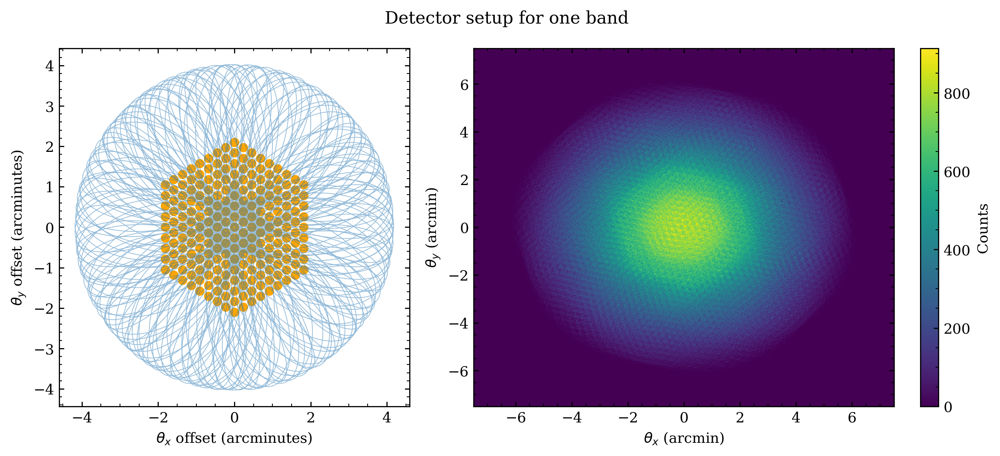

In [20]:
fig, axes = plt.subplots(
    1,
    2,
    figsize=(10, 4.5),
    dpi=256,
    tight_layout=True,
    gridspec_kw={"width_ratios": [1, 1.5]},
)
fig.suptitle("Detector setup for one band")

for uband in sim.instrument.bands:
    band_mask = sim.instrument.dets.band == uband

    axes[0].plot(
        60 * np.degrees(tod.boresight.ra - tod.boresight.ra.mean()),
        60 * np.degrees(tod.boresight.dec - tod.boresight.dec.mean()),
        lw=5e-1,
        alpha=0.5,
        label="Scanning Pattern",
    )
    axes[0].scatter(
        60 * np.degrees(sim.instrument.offset_x),
        60 * np.degrees(sim.instrument.offset_y),
        label=f"{uband} mean",
        lw=5e-1,
        c="orange",
    )

axes[0].set_xlabel(r"$\theta_x$ offset (arcminutes)")
axes[0].set_ylabel(r"$\theta_y$ offset (arcminutes)")
# axes[0].legend()

xs, ys = np.meshgrid(
    60 * np.rad2deg((mapper.x_bins[1:] + mapper.x_bins[:-1]) / 2),
    60 * np.rad2deg((mapper.y_bins[1:] + mapper.y_bins[:-1]) / 2),
)

im = axes[1].pcolormesh(
    xs,
    ys,
    mapper.raw_map_cnts[tod.dets.band[0]],
    label="Photon counts in band " + tod.dets.band[0],
)

axes[1].set_xlabel(r"$\theta_x$ (arcmin)"), axes[1].set_ylabel(r"$\theta_y$ (arcmin)")
cbar = plt.colorbar(im, ax=axes[1])
cbar.set_label("Counts")
plt.show()

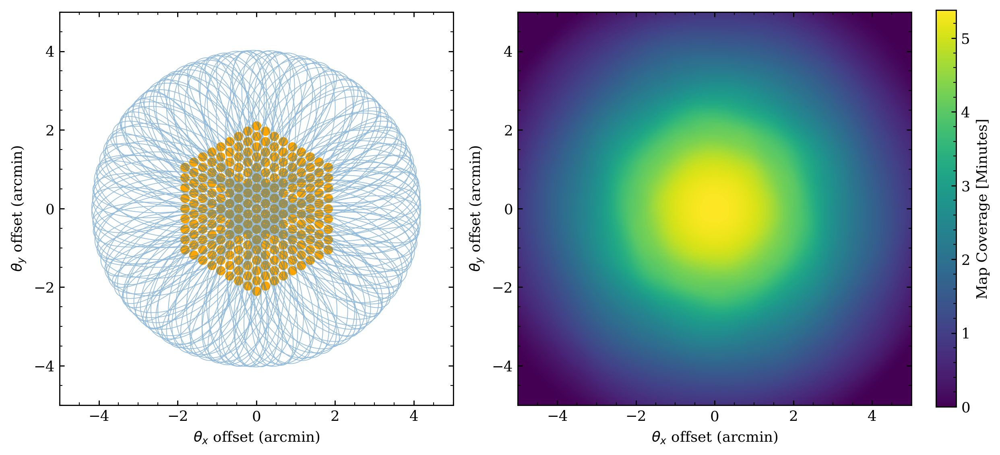

In [60]:
fig, axes = plt.subplots(
    1,
    2,
    figsize=(10, 4.5),
    dpi=256,
    tight_layout=True,
    gridspec_kw={"width_ratios": [1, 1.25]},
)
# fig.suptitle("Detector setup for one band")

for uband in sim.instrument.bands:
    band_mask = sim.instrument.dets.band == uband

    axes[0].plot(
        60 * np.degrees(tod.boresight.ra - tod.boresight.ra.mean()),
        60 * np.degrees(tod.boresight.dec - tod.boresight.dec.mean()),
        lw=5e-1,
        alpha=0.5,
        label="Scanning Pattern",
    )
    axes[0].scatter(
        60 * np.degrees(sim.instrument.offset_x),
        60 * np.degrees(sim.instrument.offset_y),
        label=f"{uband} mean",
        lw=5e-1,
        c="orange",
    )

axes[0].set_xlabel(r"$\theta_x$ offset (arcmin)")
axes[0].set_ylabel(r"$\theta_y$ offset (arcmin)")
axes[0].axis(xmin = -5, xmax = 5, ymin = -5, ymax = 5)

# axes[0].legend()
axes[0].set( aspect='equal')
xs, ys = np.meshgrid(
    60 * np.rad2deg((mapper.x_bins[1:] + mapper.x_bins[:-1]) / 2),
    60 * np.rad2deg((mapper.y_bins[1:] + mapper.y_bins[:-1]) / 2),
)


beam_area = np.pi*((8.5/2)**2)/4/np.log(2)
smoothed = sp.ndimage.gaussian_filter(mapper.raw_map_cnts[tod.dets.band[0]]/sample_rate/60, sigma=4)
im = axes[1].pcolormesh(
    xs,
    ys,
    smoothed*beam_area,
    label="Photon counts in band " + tod.dets.band[0],
    rasterized = True
)
axes[1].set( aspect='equal')
axes[1].set_xlabel(r"$\theta_x$ offset (arcmin)"), axes[1].set_ylabel(r"$\theta_y$ offset (arcmin)")
axes[1].axis(xmin = -5, xmax = 5, ymin = -5, ymax = 5)

cbar = plt.colorbar(im, ax=axes[1])
cbar.set_label("Map Coverage [Minutes]")
plt.savefig('/Users/jvanmarr/Documents/Papers/maria/paper_plots/M2_scanning_45min.pdf', dpi = fig.dpi)
plt.show()

In [22]:
np.sum(smoothed)/sim.instrument.n_dets

42.74968333333309

In [23]:
beam_area

20.466438765438422

## Visualizing the maps
As interesting as the detector setup, power spectra, and time series are, the goal of this module is to create synthetic images. In order to do that, we first save the maps to fits files, simply by running ```mapper.save_maps()```. This will output the fits and update the header according to the newly set observations. The units of the fits file are the same as specified in the ```Simulation``` class, so in Jy/pixel or in Kelvin Rayleigh Jeans. The saved fits file is a cube with axis (number of bands, pixels, pixels).

In [24]:
mapper.save_maps(outfile_map)

Below, we will visualize the maps we made, this is the final product. 

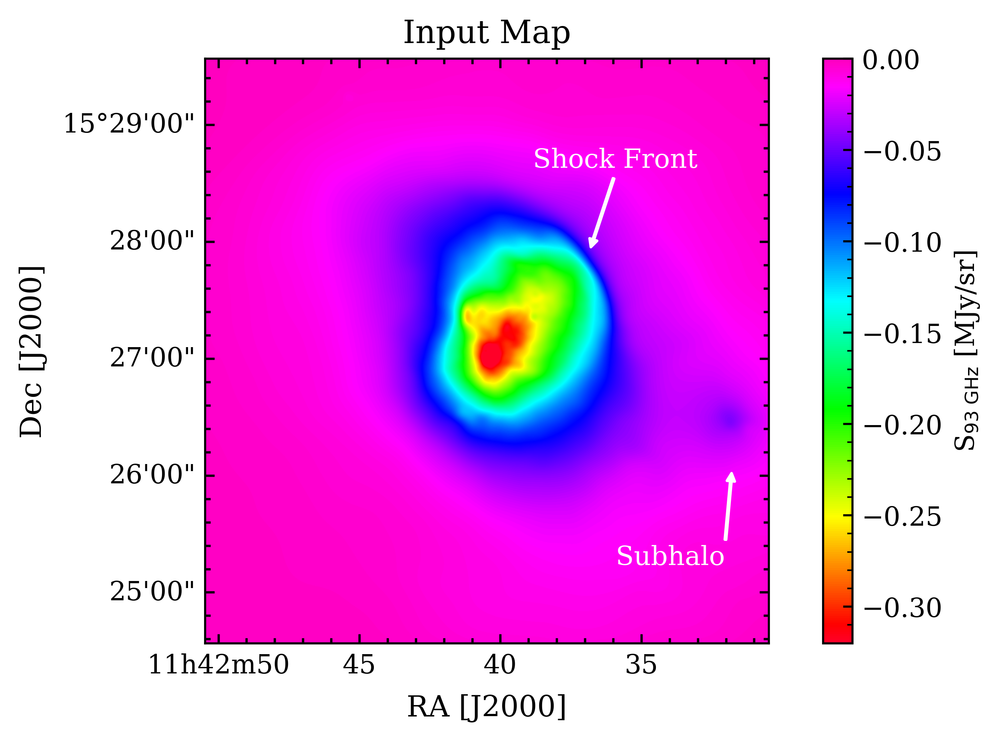

In [25]:
lower = SkyCoord(ra = (pointing_center[0]-2.5/60)*u.deg, dec=(pointing_center[1]-2.5/60.0)*u.deg)
upper = SkyCoord(ra = (pointing_center[0]+2.5/60)*u.deg, dec=(pointing_center[1]+2.5/60.0)*u.deg)


fig = plt.figure(dpi=512, tight_layout=False)
fig.set_size_inches(6, 4, forward=True)

# - Plot Input sky
ax = plt.subplot(1, 1, 1, projection=wcs_input)
ax.set_title("Input Map")
im = ax.imshow(
    hdu[0].data / (np.radians(pixel_size)) ** 2 / 1e6,
    vmin=-0.32,
    vmax=0,
    # cmap=cmocean.cm.deep,
    cmap = 'gist_rainbow',
    rasterized=True
)
cbar = plt.colorbar(im, ax=ax, shrink=1.0)
cbar.set_label(r"S$_{93~\rm GHz}$ [MJy/sr]")

ax.annotate('Shock Front', (330, 670), (290, 800), c = 'white', 
            arrowprops=dict(facecolor='white', headlength = 3, headwidth = 3, width = 0.5,  edgecolor='white'), 
            fontsize = 10, 
            horizontalalignment="center",
) 
ax.annotate('Subhalo', (100, 300), (200, 150), c = 'white', 
            arrowprops=dict(facecolor='white', headlength = 3, headwidth = 3, width = 0.5,  edgecolor='white'), 
            fontsize = 10, 
            horizontalalignment="center",
) 

ra, dec = ax.coords
ra.set_major_formatter("hh:mm:ss")
dec.set_major_formatter("dd:mm:ss")
ra.set_axislabel(r"RA [J2000]", size=11)
dec.set_axislabel(r"Dec [J2000]", size=11)
ra.set_separator(("h", "m"))


pixel_lower = wcs_input.world_to_pixel(lower)
pixel_upper = wcs_input.world_to_pixel(upper)

ax.axis(xmax=pixel_lower[0], xmin =pixel_upper[0], ymin=pixel_lower[1], ymax=pixel_upper[1])
plt.savefig(f'/Users/jvanmarr/Documents/Papers/maria/paper_plots/input_map.pdf', dpi = fig.dpi)
plt.show()

In [26]:
inputfile = "/tmp/cluster.fits"
# outfile_map = "/tmp/fake_cluster_noisy.fits"
outfile_map = "/tmp/fake_cluster_noiseless.fits"
# outfile_map = "/tmp/empty.fits"

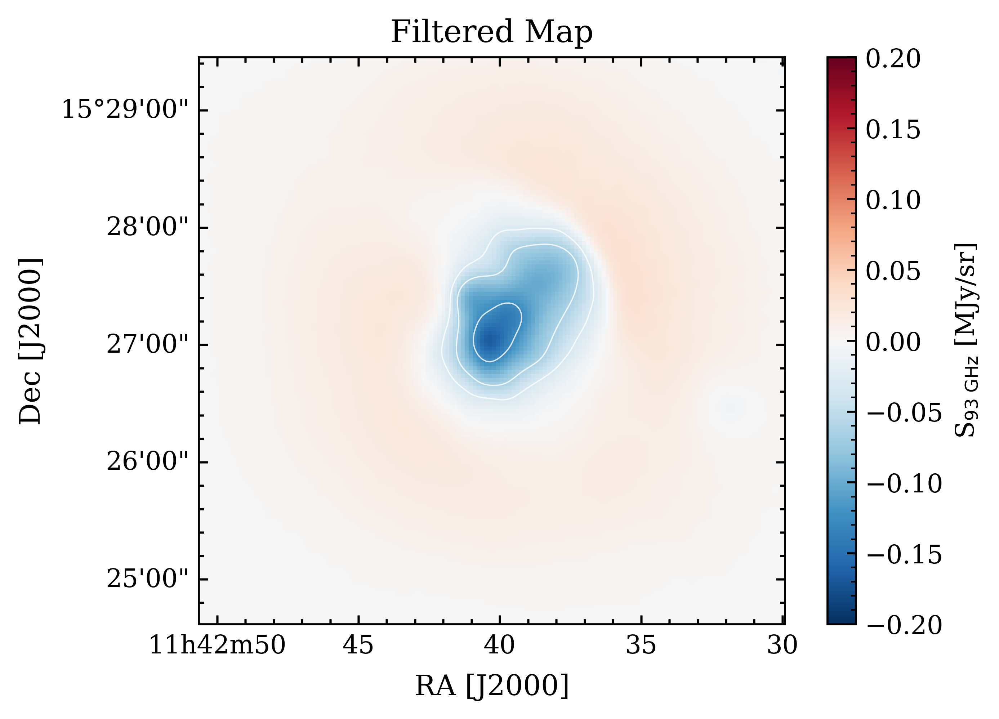

In [27]:
# - Plot Mock observation
outputfile = outfile_map

hdu_out = fits.open(outputfile)
wcs_output = WCS(hdu_out[0].header, naxis=2)

pixel_lower = wcs_output.world_to_pixel(lower)
pixel_upper = wcs_output.world_to_pixel(upper)

# sliced_image = hdu_out[0].data[0] * utils.units.KbrightToJyPix(hdu_out[0].header["CRVAL3"], hdu_out[0].header["CDELT1"], hdu_out[0].header["CDELT2"])
sliced_image = hdu_out[0].data[0][int(pixel_lower[0]):int(pixel_upper[0]), int(pixel_lower[1]):int(pixel_upper[1])] * utils.units.KbrightToJyPix(hdu_out[0].header["CRVAL3"], hdu_out[0].header["CDELT1"], hdu_out[0].header["CDELT2"])
sliced_wcs = wcs_output[int(pixel_lower[0]):int(pixel_upper[0]), int(pixel_lower[1]):int(pixel_upper[1])] 

# - Plot

fig = plt.figure(dpi=512, tight_layout=False)
fig.set_size_inches(6, 4, forward=True)
# fig.set_size_inches(24, 16, forward=False)

ax = plt.subplot(1, 1, 1, projection=sliced_wcs)
# ax = plt.subplot(1, 1, 1, projection=wcs_output)
ax.set_title("Filtered Map")


im = ax.imshow(
    sliced_image / (mapper.res**2) / 1e6, cmap=cmap, vmin=-.2, vmax=.2, rasterized=True
)

# im = ax.imshow(
#     hdu_out[0].data[0] / (mapper.res**2) / 1e6 * utils.units.KbrightToJyPix(hdu_out[0].header["CRVAL3"], hdu_out[0].header["CDELT1"], hdu_out[0].header["CDELT2"]), 
#     cmap=cmap, 
#     vmin=-8,
#     vmax=8,
#     rasterized=True
# )

std = 0.015679655450480202
ax.contour(sliced_image / (mapper.res**2) / 1e6 / std, levels = [-16,-12, -8, -4, -2, 2,  4], colors = 'white', linestyles = '-', linewidths = 0.5, alpha = 0.8)

cbar = plt.colorbar(im, ax=ax, shrink=1.0)
cbar.set_label(r"S$_{93~\rm GHz}$ [MJy/sr]")

ra, dec = ax.coords
ra.set_major_formatter("hh:mm:ss")
dec.set_major_formatter("dd:mm:ss")
ra.set_axislabel(r"RA [J2000]", size=11)
dec.set_axislabel(r"Dec [J2000]", size=11)
ra.set_separator(("h", "m"))

ax.invert_xaxis()

plt.tight_layout()
plt.savefig(f'/Users/jvanmarr/Documents/Papers/maria/paper_plots/synthethic_map.pdf', dpi = fig.dpi)
plt.show()

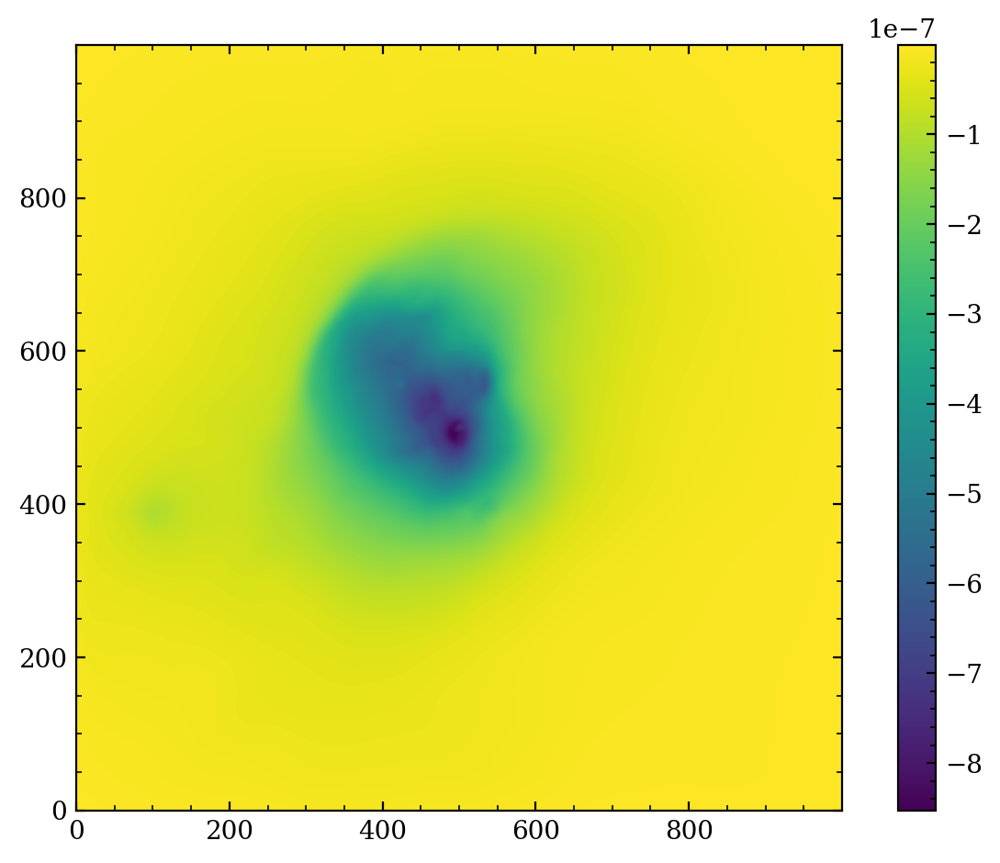

In [28]:
plt.imshow(hdu[0].data)
plt.colorbar()

# stds

In [29]:
ims_maria     = hdu_out[0].data[0]  / (mapper.res**2) / 1e6 * utils.units.KbrightToJyPix(hdu_out[0].header["CRVAL3"], hdu_out[0].header["CDELT1"], hdu_out[0].header["CDELT2"])
mask_maria    = circle_mask(ims_maria, len(ims_maria)//2, len(ims_maria)//2, 30)
std_maria     = np.std(ims_maria[mask_maria])


print(std_maria)

0.046931394383827034


In [30]:
utils.units.KbrightToJyPix(hdu_out[0].header["CRVAL3"], hdu_out[0].header["CDELT1"], hdu_out[0].header["CDELT2"])

0.024448783352461347

# reproject

In [31]:
def lambda_over_D(freq=92, D=100):
    return (((1.22 * c/(freq*u.GHz).to(1/u.s)/(D*u.m)) *u.rad).to(u.arcsec)).value
lambda_over_D()

8.200075280622515

In [32]:
from reproject import reproject_interp

smoothed = sp.ndimage.gaussian_filter(hdu[0].data, sigma=lambda_over_D()/2) 
sim_projected, footprint = reproject_interp(
    (hdu[0].data, wcs_input), wcs_output, shape_out=hdu_out[0].data[0].shape
)

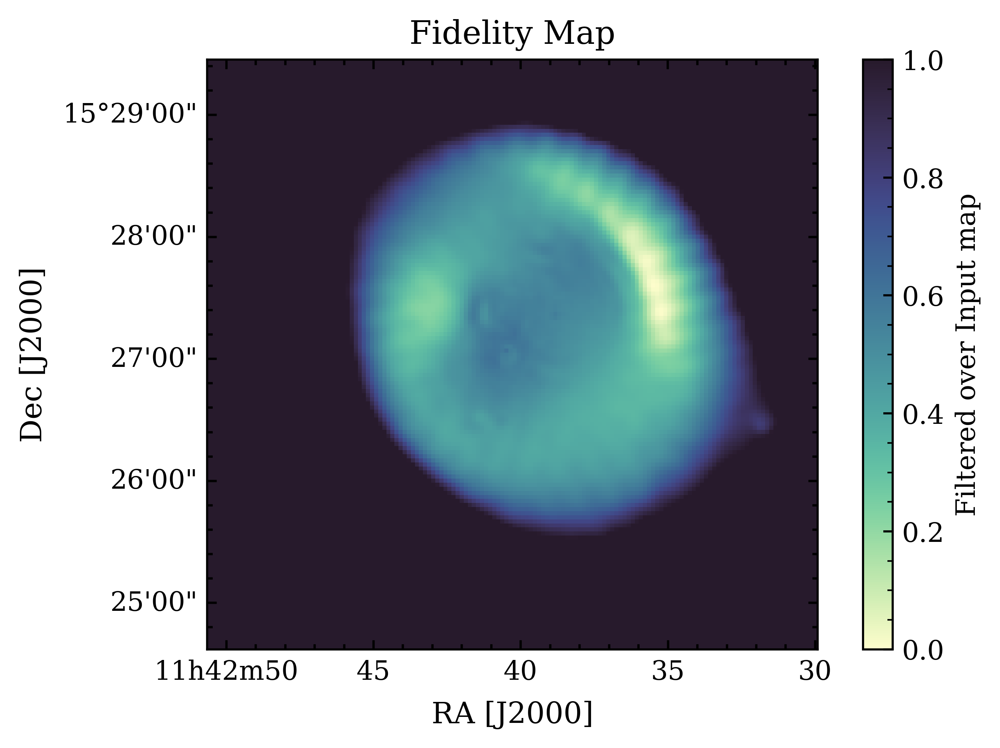

In [33]:
pixel_lower = wcs_output.world_to_pixel(lower)
pixel_upper = wcs_output.world_to_pixel(upper)
 
sliced_image1 = hdu_out[0].data[0] * utils.units.KbrightToJyPix(hdu_out[0].header["CRVAL3"], hdu_out[0].header["CDELT1"], hdu_out[0].header["CDELT2"])
sliced_image1 -= np.nanmax(sliced_image1)
sliced_image2 = sim_projected/(pixel_size/(2/3600))**2
sliced_image  = (sliced_image1/sliced_image2)[int(pixel_lower[0]):int(pixel_upper[0]), int(pixel_lower[1]):int(pixel_upper[1])]
sliced_wcs = wcs_output[int(pixel_lower[0]):int(pixel_upper[0]), int(pixel_lower[1]):int(pixel_upper[1])] 

# - Plot

fig = plt.figure(dpi=512, tight_layout=False)
fig.set_size_inches(6, 4, forward=True)

ax = plt.subplot(1, 1, 1, projection=sliced_wcs)
# ax = plt.subplot(1, 1, 1, projection=wcs_output)
ax.set_title("Fidelity Map")

im = ax.imshow(sliced_image,cmap=cmocean.cm.deep, rasterized=True, vmin = 0, vmax = 1)

cbar = plt.colorbar(im, ax=ax, shrink=1.0)
cbar.set_label(r"Filtered over Input map")

ra, dec = ax.coords
ra.set_major_formatter("hh:mm:ss")
dec.set_major_formatter("dd:mm:ss")
ra.set_axislabel(r"RA [J2000]", size=11)
dec.set_axislabel(r"Dec [J2000]", size=11)
ra.set_separator(("h", "m"))

ax.invert_xaxis()

plt.tight_layout()
plt.savefig(f'/Users/jvanmarr/Documents/Papers/maria/paper_plots/fidelity_map.pdf', dpi = fig.dpi)
plt.show()

# Transfer function

In [34]:
inputfile = "/tmp/cluster.fits"
outfile_map = "/tmp/fake_cluster_noiseless.fits"
# outfile_map = "/tmp/fake_cluster_noisy.fits"
# outfile_map = "/tmp/empty.fits"

In [35]:
from reproject import reproject_interp
from IPython.display import clear_output

In [36]:
def arcsec2uvdist(arcsec = 1.65*60):
    return 1/np.deg2rad(arcsec/3600)/1e3

def uvdist2arcsec(uvdist):
    return np.rad2deg(1/(uvdist*1e3))*3600

def l2arcsec(ell):
    return 180/ell*3600

def arcsec2l(arcsec):
    return 180/(arcsec/3600)

def l2uvdist(ell):
    return arcsec2uvdist(l2arcsec(ell))

def uvdist2l(uvdist):
    return arcsec2l((uvdist2arcsec))

In [37]:
def ps_estimator(im, header):
    kmap  = np.fft.fft2(im)
    power = (kmap*np.conj(kmap)).real

    klambda = np.fft.fftfreq(len(im), d = header['CDELT1']*np.pi/180)/1e3
    kx, ky  = np.meshgrid(klambda, klambda)
    klmap   = (kx**2+ky**2)**0.5
    return klmap, power

In [38]:
def error_prop(a1, a2, e1, e2):
    error = (((e1/a1)**2 + (e2/a2)**2) * (a1/a2)**2)**0.5
    error = (0.5 * (a1/a2)**-0.5 * error)
    # error = 1/np.log(10) * error
    return error

In [39]:
def get_PS_ratio(i = 0, noisy = False, vis = False):

    # load in
    # ---------
    outfile_map = "/tmp/fake_cluster_noiseless.fits"
    
    hdu_out = fits.open(outfile_map)
    hdu_out[0].data[0] = hdu_out[0].data[0] -  np.nanmax(hdu_out[0].data[0])
    hdu_out[0].data[0] *= utils.units.KbrightToJyPix(hdu_out[0].header["CRVAL3"], hdu_out[0].header["CDELT1"], hdu_out[0].header["CDELT2"])
    wcs_output = WCS(hdu_out[0].header, naxis=2)
    
    hdu_in = fits.open( "/tmp/cluster.fits")
    hdu_in[0].header["CDELT1"] = pixel_size  # degree
    hdu_in[0].header["CDELT2"] = pixel_size  # degree
    hdu_in[0].header["CTYPE1"] = "RA---SIN"
    hdu_in[0].header["CUNIT1"] = "deg     "
    hdu_in[0].header["CTYPE2"] = "DEC--SIN"
    hdu_in[0].header["CUNIT2"] = "deg     "
    hdu_in[0].header["CRVAL1"] = pointing_center[0]
    hdu_in[0].header["CRVAL2"] = pointing_center[1]
        
    wcs_input = WCS(hdu_in[0].header, naxis=2)

    sim_projected, footprint = reproject_interp(
        (hdu_in[0].data, wcs_input), wcs_output, shape_out=hdu_out[0].data[0].shape
    )
    sim_projected =  sim_projected * np.radians(2/3600)**2/np.radians(pixel_size)**2

    # pad and add white noise:
    # -----------------------
    im1 = (hdu_out[0].data[0] - np.nanmax(hdu_out[0].data[0]))
    im1[np.isnan(im1)] = 0.
    im1 = np.pad(im1, (512-im1.shape[0])//2+1)[0:512,0:512] + np.random.normal(scale = std_empty_run, size = (512,512))

    im2 = sim_projected
    im2[np.isnan(im2)] = 0.
    im2 = np.pad(im2, (512-im2.shape[0])//2+1)[0:512,0:512] + np.random.normal(scale = std_empty_run, size = (512,512))

    # get estimator
    # ------------
    
    kl1, ps1 = ps_estimator(im1, hdu_out[0].header)
    kl2, ps2 = ps_estimator(im2, hdu_out[0].header)

    if vis:
        fig, axes = plt.subplots(1,3)
        fig.set_figwidth(15)
        
        ax = axes[0]
        im = ax.imshow(im1)
        cbar = plt.colorbar(im, ax = ax)
        
        ax = axes[1]
        im = ax.imshow(np.log10(np.fft.fftshift(ps1)))
        cbar = plt.colorbar(im, ax = ax)
        
        ax = axes[2]
        im = ax.imshow(kl1)
        cbar = plt.colorbar(im, ax = ax)
        
        plt.show()

        
        fig, axes = plt.subplots(1,3)
        fig.set_figwidth(15)
        
        ax = axes[0]
        im = ax.imshow(im2)
        cbar = plt.colorbar(im, ax = ax)
        
        ax = axes[1]
        im = ax.imshow(np.log10(np.fft.fftshift(ps2)))
        cbar = plt.colorbar(im, ax = ax)
        
        ax = axes[2]
        im = ax.imshow(kl2)
        cbar = plt.colorbar(im, ax = ax)
        
        plt.show()

    bin_edges = np.logspace(-1,np.log10(40),50)
    # bin_edges = np.logspace(-1,np.log10(40),25)
    centers = (bin_edges[1:] + bin_edges[:-1])/2.
    
    PS1, STD1 = binned_test(ps1, kl1, bin_edges, vis = False)
    PS2, STD2 = binned_test(ps2, kl2, bin_edges)

    return PS1, PS2, centers

In [40]:
def binned_test(data,modlmap,bin_edges, vis = False):
    means = []
    stds = []
    for i in range(len(bin_edges)-1):
        mask  = (modlmap >= bin_edges[i]) & (modlmap < bin_edges[i+1])
        means.append(np.nanmean(data[mask]))
        stds .append(np.nanstd(data[mask]) )

        if vis:
            clear_output(True)
            plt.figure()
            plt.title(i)
            plt.imshow(modlmap*mask)
            plt.colorbar()
            plt.show()
    
    return np.array(means), np.array(stds)

In [41]:
std_empty_run = 3e-6

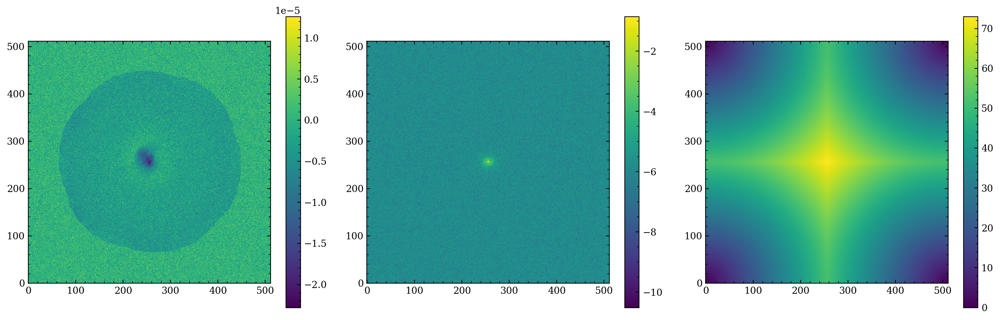

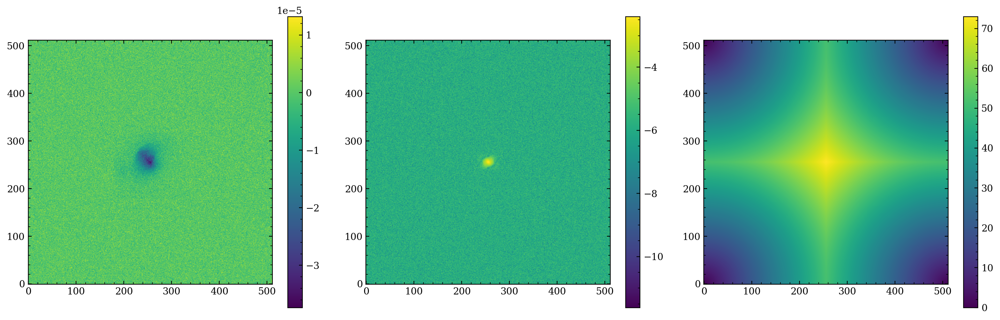

/var/folders/dz/kktxxpcd3nb88n4wx8ks3sm00008f9/T/ipykernel_9711/3794540790.py:6: RuntimeWarning: Mean of empty slice
  means.append(np.nanmean(data[mask]))
/Users/jvanmarr/opt/anaconda3/envs/atmos/lib/python3.10/site-packages/numpy/lib/nanfunctions.py:1879: RuntimeWarning: Degrees of freedom <= 0 for slice.
  var = nanvar(a, axis=axis, dtype=dtype, out=out, ddof=ddof,


In [42]:
_ = get_PS_ratio(vis = True)

In [43]:
from matplotlib.ticker import ScalarFormatter
from matplotlib.ticker import FormatStrFormatter


/var/folders/dz/kktxxpcd3nb88n4wx8ks3sm00008f9/T/ipykernel_9711/3794540790.py:6: RuntimeWarning: Mean of empty slice
  means.append(np.nanmean(data[mask]))
/var/folders/dz/kktxxpcd3nb88n4wx8ks3sm00008f9/T/ipykernel_9711/3680209179.py:5: RuntimeWarning: divide by zero encountered in divide
  return np.rad2deg(1/(uvdist*1e3))*3600
/var/folders/dz/kktxxpcd3nb88n4wx8ks3sm00008f9/T/ipykernel_9711/3680209179.py:5: RuntimeWarning: divide by zero encountered in divide
  return np.rad2deg(1/(uvdist*1e3))*3600


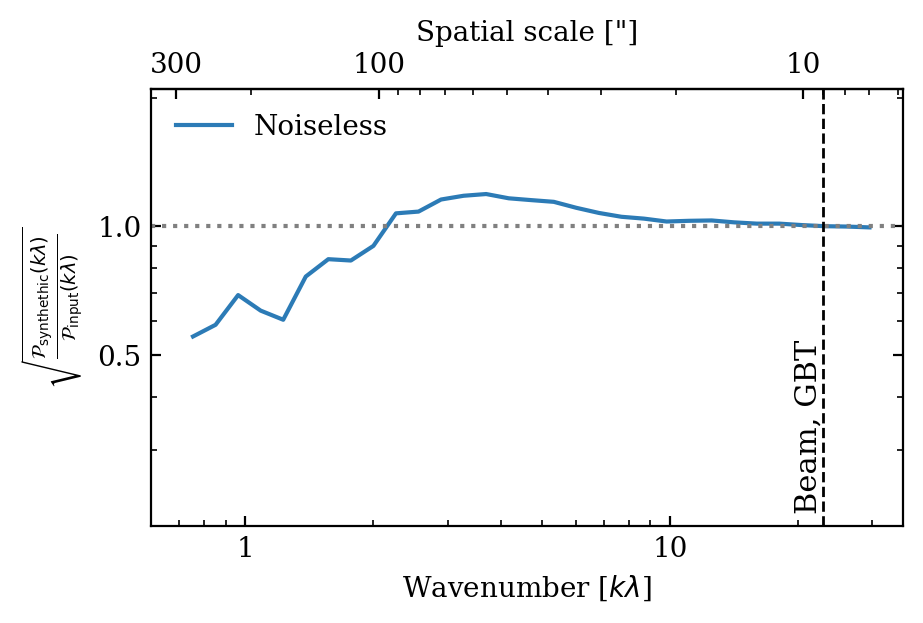

In [44]:
fig, ax = plt.subplots(constrained_layout=True)
fig.set_figheight(3)
fig.set_figwidth(4.5)
ax.loglog()

i = 0
for noisy in [False]:
    PS1, PS2, centers = get_PS_ratio(i = i, noisy=noisy)
    np.save('/Users/jvanmarr/Documents/Papers/maria/output/M2_PS_noiseless.npy', np.array([centers, (PS1/PS2)**0.5]))
    if not noisy:
        # ax.plot(centers, (PS1/PS2)**0.5, label = f'Noiseless', ls = '-', c = f'C{i}')
        box_pts = 5
        box = np.ones(box_pts)/box_pts
        ax.plot(centers[centers<30], np.convolve((PS1/PS2)**0.5, box, mode='same')[centers<30], label = f'Noiseless', ls = '-', c = f'C{i}')
    else:
        ax.plot(centers, (PS1/PS2)**0.5, ls = '--', c = f'C{i}') 


# ax.plot(cs, (P1s/P2s)**0.5, label = 'MUSTANG-2', c = 'gray', alpha = 0.2)
# ax.plot(cs, (P3s/P2s)**0.5, c = 'gray', alpha = 0.2, ls ='--')
            
ax.axhline(1, c='gray', ls =':')
ax.set_ylabel(r"$\sqrt{\frac{\mathcal{P}_{\rm synthethic}(k\lambda)}{\mathcal{P}_{\rm input}(k\lambda)}}$")
ax.set_xlabel(r'Wavenumber [$k\lambda$]')

ax.tick_params(axis = 'x', which = 'both', top=False)


# ax.axvline(uvdist2arcsec(8), c = 'k', lw = 1, ls ='--')
# ax.text(uvdist2arcsec(8.8), 0.12, 'Beam, M2', c='k', rotation = 90, fontsize = 7)

ax.axvline(arcsec2uvdist(9), c = 'k', lw = 1, ls ='--')
ax.text(arcsec2uvdist(10.5), 0.22, 'Beam, GBT', c='k', rotation = 90, fontsize = 11)

# ax.axvline(arcsec2uvdist(16), c = 'k', lw = 1, ls ='--')
# ax.text(arcsec2uvdist(22), 0.12, 'Beam, AtLAST', c='k', rotation = 90, fontsize = 11)

secax = ax.secondary_xaxis('top', functions=(arcsec2uvdist, uvdist2arcsec))
secax.set_xlabel('Spatial scale ["]')
secax.set_xticks(np.array([300,100,10]))
secax.xaxis.set_major_formatter(ScalarFormatter())

# ax.plot(-1, 1, label = 'Noiseles', ls = '-', c='k')
# ax.plot(-1, 1, label = 'Noisy', ls = '--', c='k')
ax.set_yticks(np.array([0.5, 1]))
ax.set_yticklabels(np.array([0.5, 1]))
ax.xaxis.set_major_formatter(ScalarFormatter())
ax.xaxis.set_major_formatter(FormatStrFormatter('%.0f'))
ax.yaxis.set_major_formatter(ScalarFormatter())



plt.legend(frameon=False, loc = 2)
plt.axis(ymin = 0.2, xmin = 0.6, ymax = 2.1)

plt.savefig('/Users/jvanmarr/Documents/Papers/maria/paper_plots/M2_transferfunction.pdf')
plt.show()

# Beams

FWHM(z) = D (z^2 + (1/z_r)^2)^{-0.5},
 $z_r = \pi~({\rm D}/2)^2 / l$

In [45]:
matplotlib.rcParams['figure.figsize'] = [4, 4]

In [46]:
def nir_field(D, l):
    return np.pi * (D/2)**2/l

def FWHM_meters(z, D, l):
    z_r = nir_field(D,l)
    res =  D/2 * (1 + (z/z_r)**2)**(0.5)
    return res

def FWHM_angles(z, D, l):
    z_r = nir_field(D,l)
    res =  D/2 * ((1/z)**2 + (1/z_r)**2)**(0.5)
    return ((res * u.rad).to(u.arcsec)).value

In [47]:
zs = np.logspace(1,7.5,2000)
l  = (c/(150*u.GHz).to(1/u.s)).value

In [48]:
for i in [0.42,6,50]:
    print(nir_field(i, l)/1e3)

0.06932007410105187
14.146953898173853
982.4273540398509


In [49]:
nx = 1024
ny = 1024

x = np.linspace(-4, 4, nx)
y = np.linspace(-4, 4, ny)

X, Y = np.meshgrid(x, y)

kx = np.fft.fftfreq(nx, d=1/nx)
ky = np.fft.fftfreq(ny, d=1/ny)

KX, KY = np.meshgrid(kx, ky)

K = np.sqrt(KX ** 2 + KY ** 2)

P = np.where(K > 0, (1e-2 + KX**2 + KY**2) ** (-5/6), 0)
z = np.real(np.fft.fft2(P * np.exp(2j*np.pi*np.random.uniform(size=P.shape))))


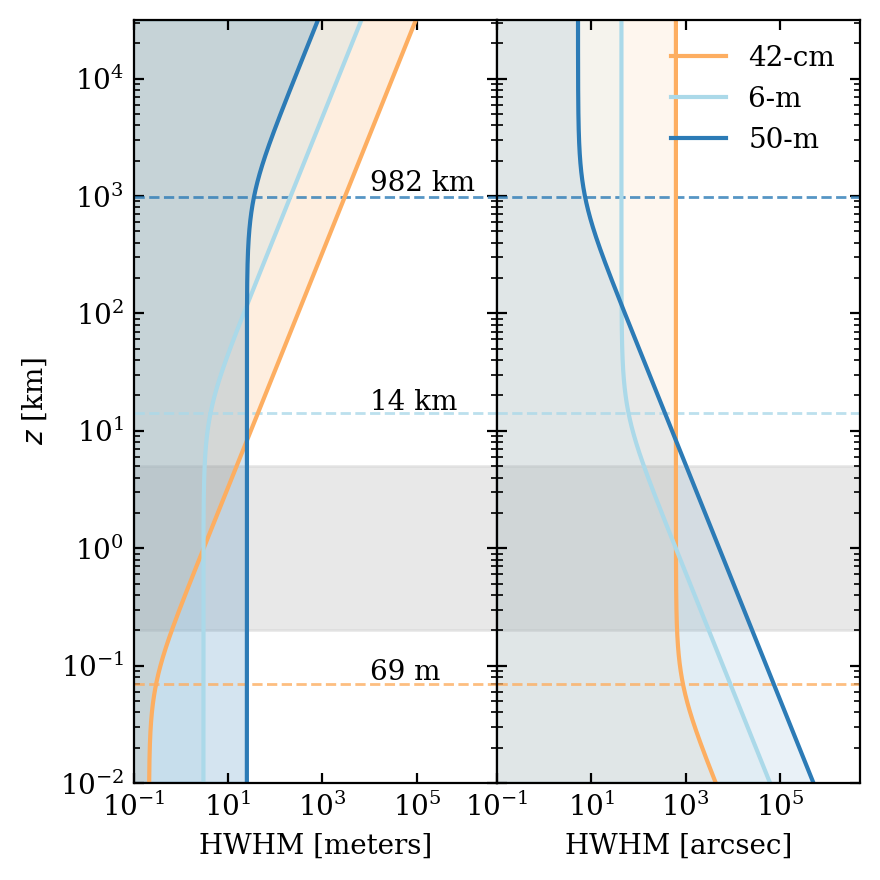

In [50]:

from matplotlib.ticker import MaxNLocator


fig, axes = plt.subplots(1, 2, sharey = True, width_ratios=[1,1], figsize = (4.5,4.5), gridspec_kw={'wspace':0})

map_extent = [0.1,5e6,0.5,5]
# axes[0].imshow(z, extent=map_extent, alpha = 0.2)
axes[0].fill_between(np.linspace(map_extent[0], map_extent[1], 2), y1 = 5, y2 = 0.2, color = 'lightgray', alpha = 0.5)

axes[0].fill_betweenx(zs/1e3, FWHM_meters(zs, 0.42, l), color = 'C2', alpha = 0.2)
axes[0].fill_betweenx(zs/1e3, FWHM_meters(zs, 6, l), color = 'C1', alpha = 0.2)
axes[0].fill_betweenx(zs/1e3, FWHM_meters(zs, 50, l), color = 'C0', alpha = 0.2)

axes[0].axhline(nir_field(0.42, l)/1e3, c = 'C2', alpha = 0.8, ls = '--', lw = 1)
axes[0].axhline(nir_field(6, l)/1e3, c = 'C1',alpha = 0.8, ls = '--', lw = 1)
axes[0].axhline(nir_field(50, l)/1e3, c = 'C0',alpha = 0.8, ls = '--', lw = 1)

axes[0].plot(FWHM_meters(zs, 0.42, l),zs/1e3, c = 'C2', label = 'SAT')
axes[0].plot(FWHM_meters(zs, 6, l),zs/1e3, c = 'C1', label = 'LAT')
axes[0].plot(FWHM_meters(zs, 50, l),zs/1e3, c = 'C0', label = 'AtLAST')

# 46.213382734034575
# 9431.302598782568
# 654951.5693599005

axes[0].text(1e4, 1100, '982 km')
axes[0].text(1e4, 15, '14 km')
axes[0].text(1e4, 0.075, '69 m')

axes[0].set_xscale('log')
axes[0].set_yscale('log')

axes[0].set_xlabel(r'HWHM [meters]')
axes[0].set_ylabel(r'$z$ [km]')
axes[0].axis(ymin = 1e-2, ymax = 10**7.5/1e3, xmin = map_extent[0], xmax = map_extent[1])

c1 = 'C2'
c2 = 'C1'
c3 = 'C0'

l1 = '-'
l2 = '-'
l3 = '-'

axes[1].fill_between(np.linspace(map_extent[0], map_extent[1], 2), y1 = 5, y2 = 0.2, color = 'lightgray', alpha = 0.5)

axes[1].fill_betweenx(zs/1e3, FWHM_angles(zs, 0.42, l), color = c1, alpha = 0.1)
axes[1].fill_betweenx(zs/1e3, FWHM_angles(zs, 6, l), color = c2, alpha = 0.1)
axes[1].fill_betweenx(zs/1e3, FWHM_angles(zs, 50, l), color = c3, alpha = 0.1)

axes[1].axhline(nir_field(0.42, l)/1e3, c = c1, alpha = 0.8, ls = '--', lw = 1)
axes[1].axhline(nir_field(6, l)/1e3, c = c2,alpha = 0.8, ls = '--', lw = 1)
axes[1].axhline(nir_field(50, l)/1e3, c = c3,alpha = 0.8, ls = '--', lw = 1)

axes[1].plot(FWHM_angles(zs, 0.42, l),zs/1e3, c = c1, label = '42-cm' , ls = l1, lw = 1.5)
axes[1].plot(FWHM_angles(zs, 6, l),zs/1e3, c = c2, label = '6-m ', ls = l2, lw = 1.5)
axes[1].plot(FWHM_angles(zs, 50, l),zs/1e3, c = c3, label = '50-m' , ls = l3, lw = 1.5)

axes[1].set_xscale('log')
axes[1].set_yscale('log')

axes[1].legend(frameon = False, loc = 1)
axes[1].set_xlabel(r'HWHM [arcsec]')
axes[1].axis(ymin = 1e-2, ymax = 10**7.5/1e3, xmin = map_extent[0], xmax = map_extent[1])

plt.tight_layout()
plt.savefig('/Users/jvanmarr/Documents/Papers/maria/paper_plots/beams.pdf', dpi = fig.dpi)
plt.show()